In [1]:
using Plots
function metric(x1,y1,x2,y2)
    return sqrt((x1-x2)^2 + (y1-y2)^2)
end

Nx = 400
Ny =100
q = 9
τ=0.52
Nt = 2000

cx = [0,0,1,1,1,0,-1,-1,-1]
cy = [0,1,1,0,-1,-1,-1,0,1]
w = [4/9,1/9,1/36,1/9,1/36,1/9,1/36,1/9,1/36]



9-element Vector{Float64}:
 0.4444444444444444
 0.1111111111111111
 0.027777777777777776
 0.1111111111111111
 0.027777777777777776
 0.1111111111111111
 0.027777777777777776
 0.1111111111111111
 0.027777777777777776

In [9]:
f = ones(Nx,Ny,q) + 0.05*rand(Nx,Ny,q)
f[:,:,4] .= 2.3
cylinder = BitArray(metric(i,j,Nx/4,Ny/2) < 20 for i in 1:Nx, j in 1:Ny)
strength = zeros(Nx,Ny,Nt)
vorticity = zeros(Nx,Ny,Nt)
for i=1:Nt
    f[Nx,:,[7,8,9]] = f[Nx-1,:,[7,8,9]]
    f[1,:,[3,4,5]] = f[1,:,[3,4,5]]
    #stream
    for i=1:q
        f[:,:,i] = circshift(f[:,:,i],(cx[i],0))
        f[:,:,i] = circshift(f[:,:,i],(0,cy[i]))
    end
    #cylinder
    boundary = f[cylinder,:]
    boundary = boundary[:,[1,6,7,8,9,2,3,4,5]]
    #macroscopic
    ρ = reshape(sum(f,dims=3),Nx,Ny)
    ux = reshape(sum(f[:,:,i] * cx[i] for i in 1:q)./ρ,Nx,Ny)
    uy = reshape(sum(f[:,:,i] * cy[i] for i in 1:q)./ρ,Nx,Ny)
    #boundary conditions
    ux[cylinder] .= 0
    uy[cylinder] .= 0
    f[cylinder,:] = boundary
    #collisions
    feq = zeros(Nx,Ny,q)
    for i in 1:q
        feq[:,:,i] =   w[i] *ρ .* ( 3*(cx[i]*ux+cy[i]*uy)+9/2*(cx[i]*ux+cy[i]*uy).^2- 3*(ux.^2 + uy.^2)/2 .+1.0)
    end
    f = f - (f - feq)/τ
    strength[:,:,i] = sqrt.(ux.^2 + uy.^2)
    vorticity[:,:,i] =(circshift(ux[:,:], (-1,0)) - circshift(ux[:,:], (1,0))) - (circshift(uy[:,:], (0,-1)) - circshift(uy[:,:], (0,1)))
end


┌ Info: Saved animation to C:\Users\batti\AppData\Local\Temp\jl_ReLwLct8DY.gif
└ @ Plots C:\Users\batti\.julia\packages\Plots\ju9dp\src\animation.jl:156


Plots.AnimatedGif("C:\\Users\\batti\\AppData\\Local\\Temp\\jl_ReLwLct8DY.gif")
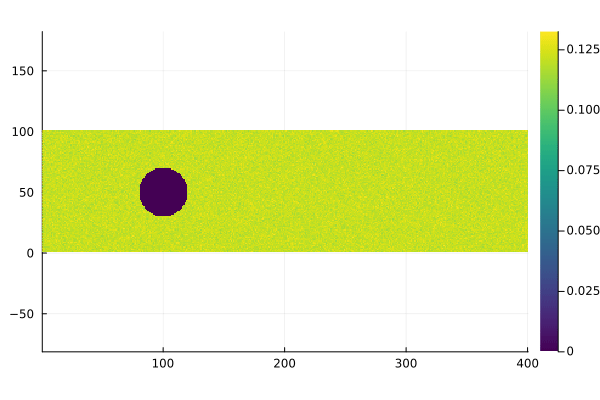

In [10]:
@gif for i=1:Nt
    heatmap(transpose(strength[:,:,i]),aspect_ratio=1,color=:viridis)
end every 10

┌ Info: Saved animation to C:\Users\batti\AppData\Local\Temp\jl_H09cXSr85w.gif
└ @ Plots C:\Users\batti\.julia\packages\Plots\ju9dp\src\animation.jl:156


Plots.AnimatedGif("C:\\Users\\batti\\AppData\\Local\\Temp\\jl_H09cXSr85w.gif")
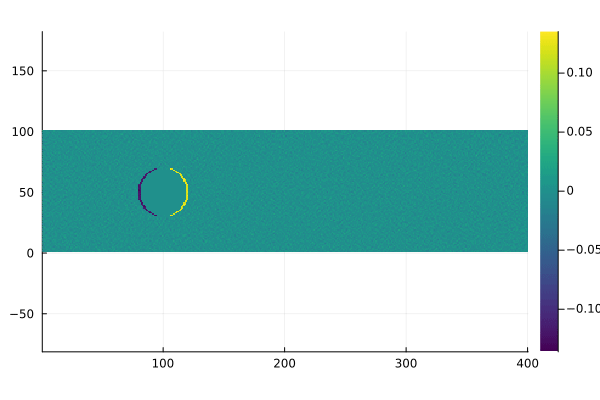

In [11]:
@gif for i=1:Nt
    heatmap(transpose(vorticity[:,:,i]),aspect_ratio=1,color=:viridis)
end every 10